## Annotation of epithelia subset

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import ma_codes as codes
from ma_codes import mysize, mymap, gray_red

Running Scanpy 1.6.1.dev110+gb4234d81, on 2021-02-20 12:53.


In [2]:
## path variables
adata_path = '/mnt/platte_1/Projects/210115_GLPG/subsets/210211_epcam+_subset_NIKLAS.h5ad'

In [3]:
## plotting variables
sc.settings.figdir = '/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/epithelia_subset/'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load anndata object
adata = sc.read(adata_path)

In [5]:
## have a look at the adata object: 27262 cells × 25194 genes
adata

AnnData object with n_obs × n_vars = 10718 × 25194
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'GLPG_annotation', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2'
    var: 'means', 'dispersions', 'dispersions_norm', 'n_cells', 'n_counts', 'highly_variable', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'GLPG_annotation_colors', 'cluster_03_colors', 'condition_colors', 'hvg', 'identifier_colors', 'louvain', 'louvain_1_colors', 'neighbors', 'pca', 'time_point_colors', 'treatment_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'unsouped_counts'
    obsp: 'connectivities', 'distances'

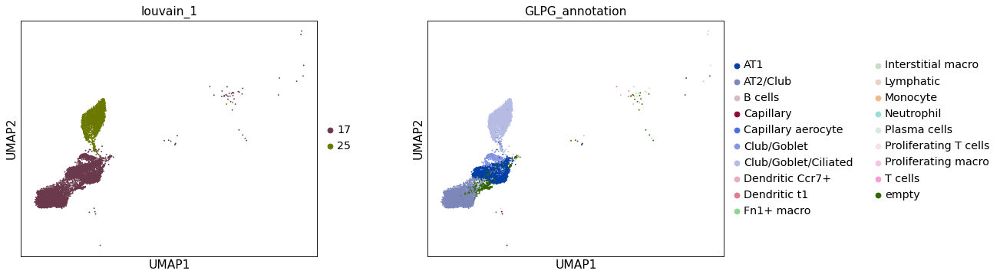

In [6]:
## overview plot
sc.pl.umap(adata, color = ['louvain_1', 'GLPG_annotation'], wspace = .25)

### Remove outliers with DBscan

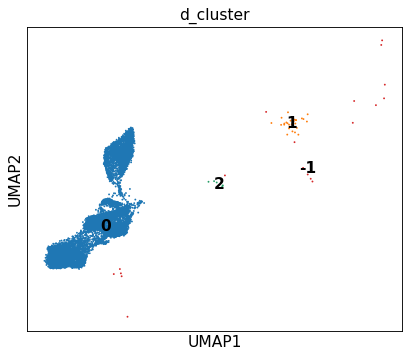

In [7]:
## using Herbert's old code snippet here
from natsort import natsorted
from sklearn.cluster import DBSCAN
def cluster_by_dscan(cords, eps, min_samples):
    clustering = DBSCAN(eps = eps, min_samples = min_samples).fit(cords)
    return clustering.labels_

adata.obs['d_cluster'] = cluster_by_dscan(adata.obsm['X_umap'], eps = 0.5, min_samples = 5)
c = adata.obs['d_cluster'].astype('U')
adata.obs['d_cluster'] = pd.Categorical(c, categories = natsorted(np.unique(c)))

sc.pl.umap(adata, color = 'd_cluster', legend_loc='on data')

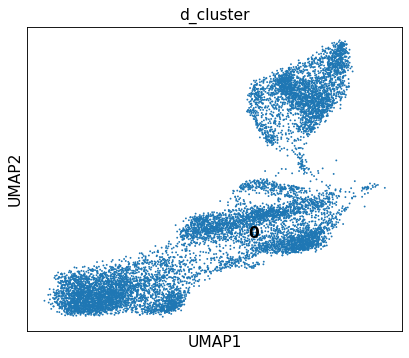

In [8]:
## discard outliers
adata = adata[adata.obs['d_cluster'].isin(['0'])].copy()
sc.pl.umap(adata, color = 'd_cluster', legend_loc='on data')

### Calculate HVGs

In [9]:
## delete all obs colums related to highly variable genes
del(adata.var['highly_variable'])
del(adata.var['highly_variable_nbatches'])
del(adata.var['highly_variable_intersection'])

In [10]:
## filter genes
sc.pp.filter_genes(adata, min_counts = 1)
sc.pp.filter_genes(adata, min_cells = 10)

filtered out 3412 genes that are detected in less than 1 counts
filtered out 3340 genes that are detected in less than 10 cells


extracting highly variable genes
/home/agando/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
    finished (0:00:18)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
/home/agando/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


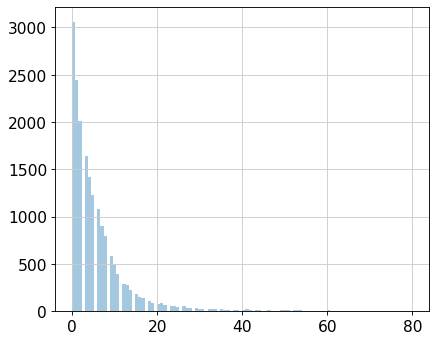

In [11]:
## compute HVGs per batch ('identifier') using seurat method
batch = 'identifier'
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 1000, n_bins = 20, flavor = 'seurat', 
                                subset = False)
vartab = pd.DataFrame(adata.var['highly_variable_nbatches'], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [12]:
## only consider a gene as variable if variable in at least 10 batches
thresh = 7
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print('%s Genes kept, variable in at least %s samples' %(len(hvgs), thresh))

5555 Genes kept, variable in at least 7 samples


In [13]:
## remove cell cycle genes (MOUSE) from list of HVGs
cc_genes = [x.strip().capitalize() for x in open('/home/agando/Documents/Meshal/PhD_Scripts/' +
                                                 'for_orientation/regev_lab_cell_cycle_genes.txt')]
hvgs = np.setdiff1d(hvgs, cc_genes)

In [14]:
## set HVGs
adata.var['highly_variable'] = [g in hvgs for g in adata.var_names]
## no. of resulting HVGs
sum(adata.var['highly_variable'])

5516

In [15]:
## check if Malat1 is in HVGs
adata.var['highly_variable']['Malat1']

False

In [16]:
## check if S100a6 is in HVGs
adata.var['highly_variable']['S100a6']

True

In [17]:
## remove S100a6 from HVGs
adata.var['highly_variable']['S100a6'] = False

/home/agando/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:08)


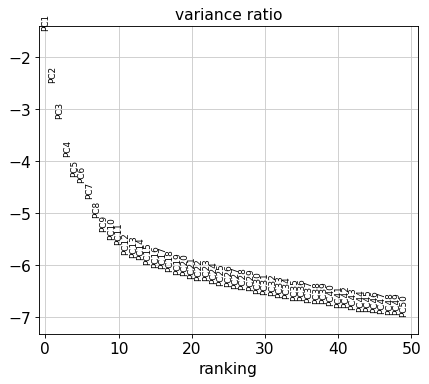

In [18]:
## PCA
sc.pp.pca(adata, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

### kNN graph

In [19]:
sc.pp.neighbors(adata, n_pcs = 50, n_neighbors = 30) # no batch correction

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:10)


### Graph-based clustering and Visualization

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'sub_louvain', the cluster labels (adata.obs, categorical) (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


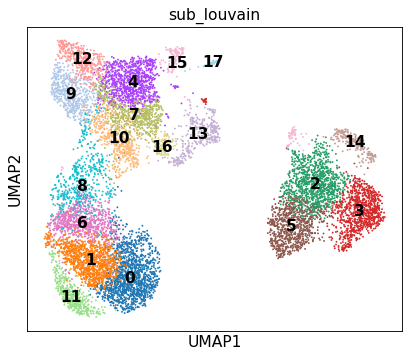

In [20]:
sc.tl.louvain(adata, resolution = 1.6, key_added = 'sub_louvain')
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['sub_louvain'], legend_loc = 'on data')

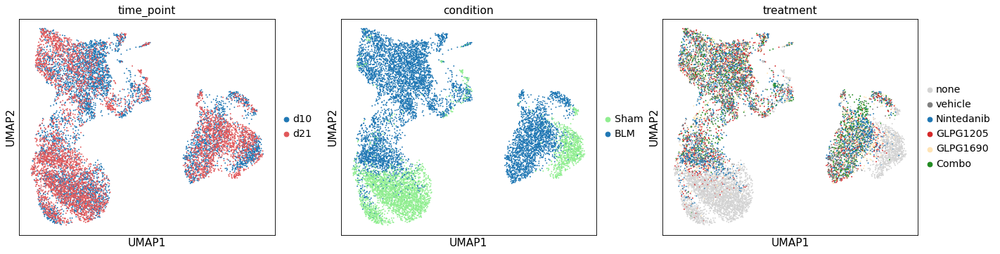

In [21]:
sc.pl.umap(adata, color = ['time_point', 'condition', 'treatment'], ncols = 3)

### Plot QC metrics

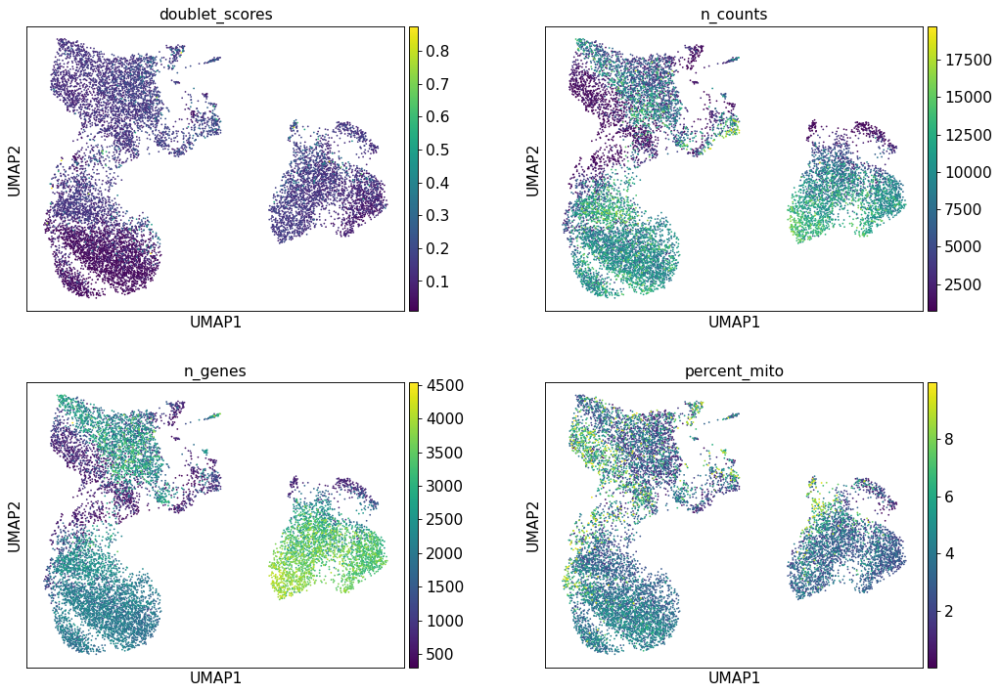

In [22]:
sc.pl.umap(adata, color = ['doublet_scores', 'n_counts', 'n_genes', 'percent_mito'], ncols = 2, wspace = 0.25, size = 10)

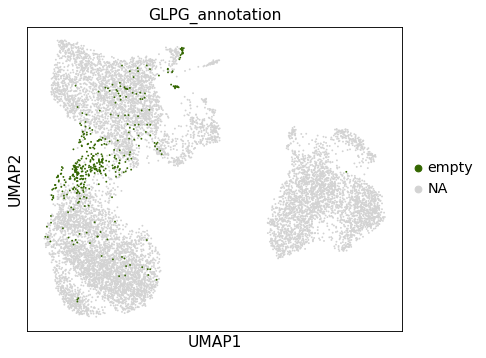

In [23]:
sc.pl.umap(adata, color = 'GLPG_annotation', groups = 'empty', color_map=gray_red)

### Plot marker genes

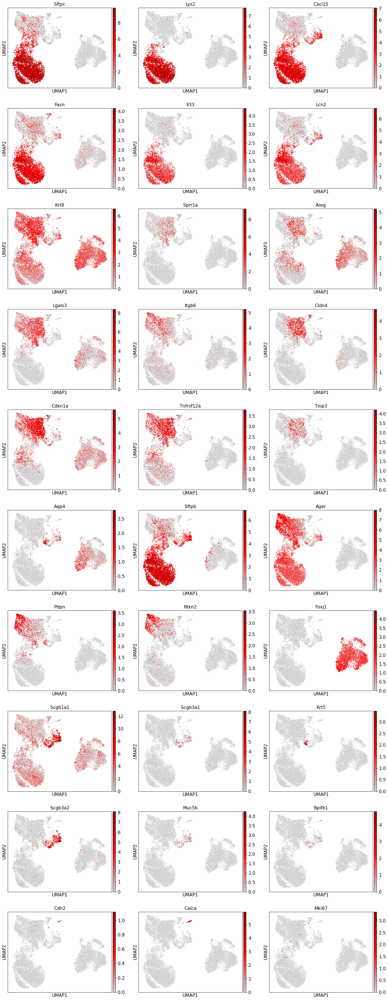

In [24]:
sc.pl.umap(adata, color = ["Sftpc", "Lyz2", "Cxcl15", "Fasn", # AT2
                           "Il33", "Lcn2", # AT2 activated 
                           "Krt8", "Sprr1a", "Areg", "Lgals3",  "Itgb6", "Cldn4", "Cdkn1a", "Tnfrsf12a", "Tnip3", # ADI
                           "Aqp4", "Sftpb", # pre AT1
                           "Ager", "Pdpn", "Rtkn2", # AT1 
                           "Foxj1", # Ciliated
                           "Scgb1a1", "Scgb3a1", # Ciliated
                           "Krt5",  # Basal cells
                           "Scgb3a2", # Club cells
                           "Muc5b", "Bpifb1", # Goblet cells
                           "Cdh2", "Calca", # neuroendocrine cells
                           "Mki67", # proliferation
                          ], ncols=3, size=20, 
           color_map=gray_red)

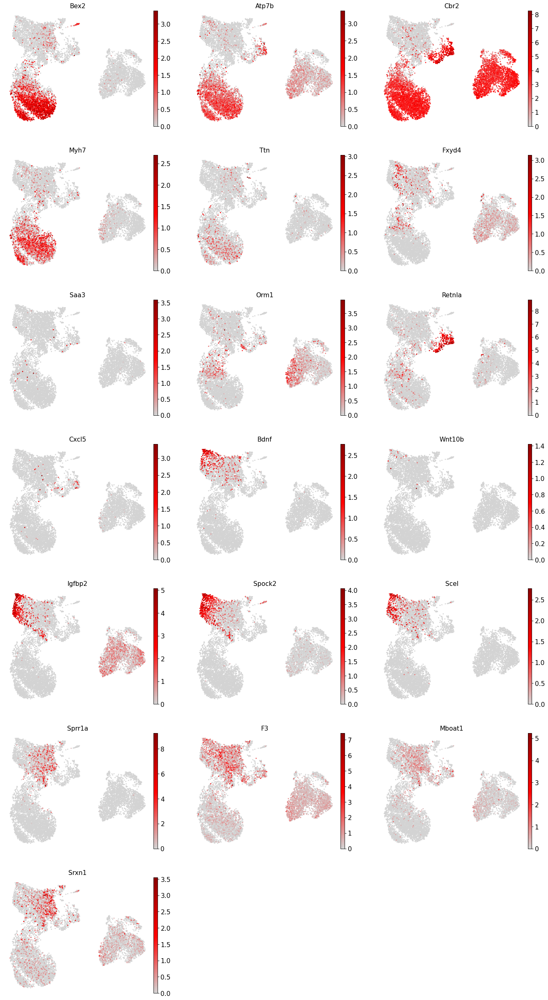

In [25]:
## plot alveolar epithelial markers
sc.pl.umap(adata, color = ["Bex2", "Atp7b", "Cbr2", "Myh7", "Ttn", # AT2
                           "Fxyd4", "Saa3", "Orm1", "Retnla", "Cxcl5", # activated AT2
                           "Bdnf", "Wnt10b", "Igfbp2", "Spock2", "Scel", # AT1
                           "Sprr1a", "F3", "Mboat1", "Srxn1" # Krt8+ ADI "Lat2"
                          ], 
           cmap = gray_red, size = 25, frameon = False, ncols = 3)

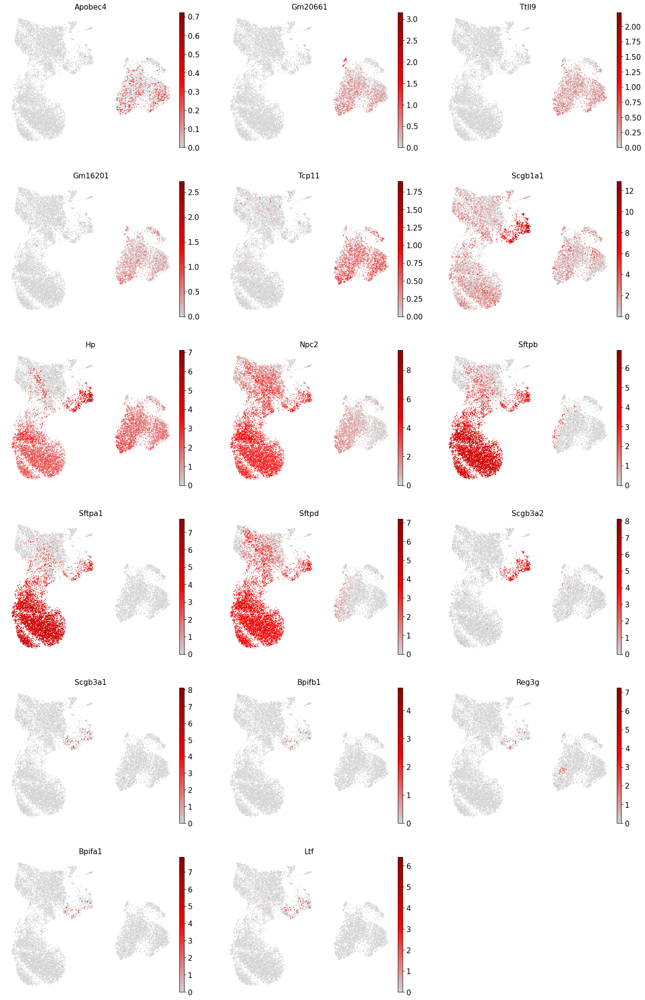

In [26]:
## plot airway epithelial markers
sc.pl.umap(adata, color = ["Apobec4", "Gm20661", "Ttll9", "Gm16201", "Tcp11", # Ciliated
                           "Scgb1a1", "Hp", "Npc2", "Sftpb", "Sftpa1", "Sftpd", # Club
                           "Scgb3a2", "Scgb3a1", "Bpifb1", "Reg3g", # Mucous, "Rtnla", "Cldn22",
                           "Bpifa1", "Ltf" # Mucous ciliated
                          ], frameon = False, ncols = 3, cmap = gray_red)

### Compute marker genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


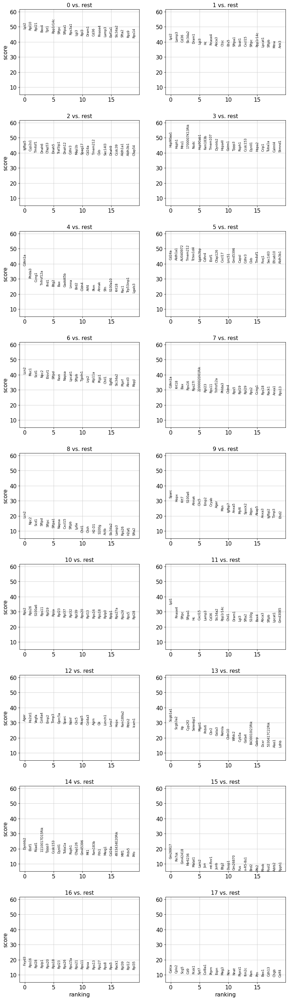

In [27]:
sc.tl.rank_genes_groups(adata, groupby = 'sub_louvain', groups = 'all', use_raw = True, method = 'wilcoxon', 
                        n_genes=100)
sc.pl.rank_genes_groups(adata, ncols = 2)

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sub_louvain']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


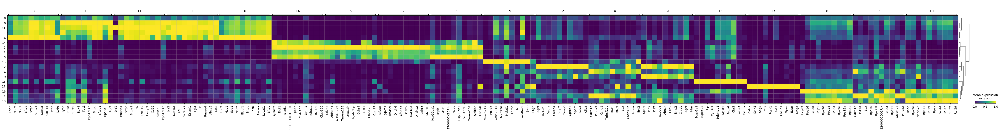

In [28]:
## find markers
sc.tl.dendrogram(adata, groupby = 'sub_louvain')
sc.tl.rank_genes_groups(adata, groupby = "sub_louvain", method = 'wilcoxon')
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 10, standard_scale = 'var')

In [29]:
## in case you want to know which genes drive the separation of two clusters (i.e. of the same cell type)
## one option would be do perform Differential Gene Expression testing between the two clusters/groups
#sub1 = adata[adata.obs.sub_louvain.isin(['0','9'])].copy()
#sc.tl.rank_genes_groups(sub1, groupby = 'sub_louvain', use_raw = True, method = 'wilcoxon')
#sc.pl.rank_genes_groups(sub1, ncols = 2)

### Preliminary Cluster Annotation

... storing 'cell_type' as categorical


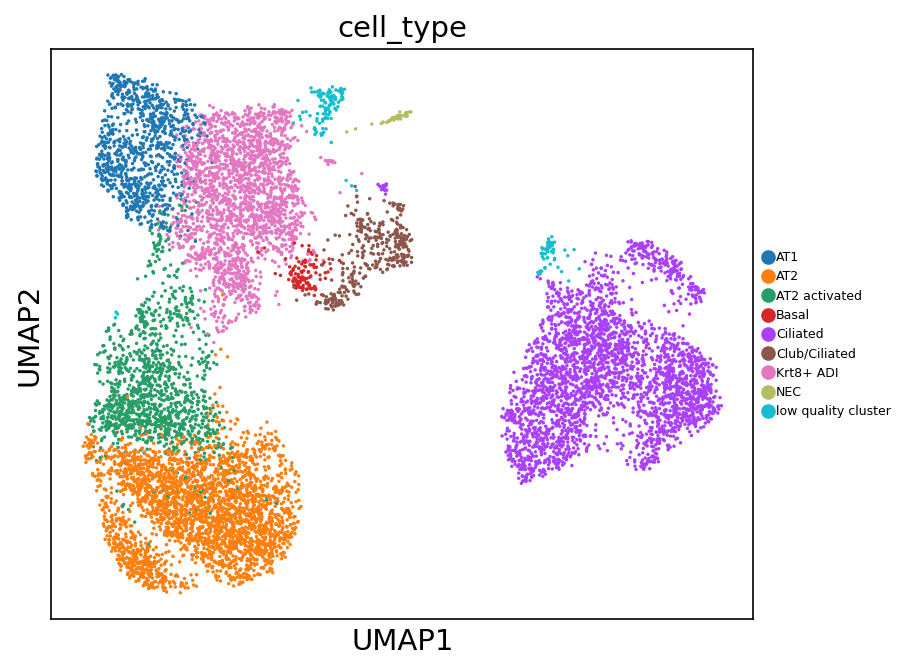

In [30]:
cell_type = {'0' : 'AT2',
             '1' : 'AT2',
             '2' : 'Ciliated',
             '3' : 'Ciliated',
             '4' : 'Krt8+ ADI',
             '5' : 'Ciliated',
             '6' : 'AT2 activated',
             '7' : 'Krt8+ ADI',
             '8' : 'AT2 activated',
             '9' : 'AT1',
             '10' : 'Krt8+ ADI',
             '11' : 'AT2',
             '12' : 'AT1',
             '13' : 'Club/Ciliated',
             '14' : 'Ciliated',
             '15' : 'low quality cluster', ## low genes plus neither AT1 nor AT2 marker
             '16' : 'Basal', 
             '17' : 'NEC',
            }

adata.obs['cell_type'] = [cell_type[cluster] for cluster in adata.obs['sub_louvain']]
sc.pl.umap(adata, color = 'cell_type', ax = mysize(6, 5, 150), legend_fontsize = 6)

### Remove low-quality cells and re-calculate UMAP

In [31]:
## remove low quality clusters
adata = adata[-adata.obs.cell_type.isin(['low quality cluster'])].copy()

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


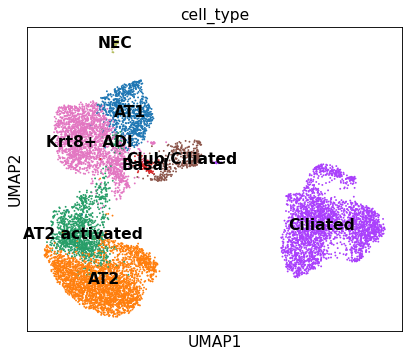

In [34]:
## UMAP
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['cell_type'], legend_loc = 'on data')

### Re-calculate markers (of final annotated cell type clusters)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


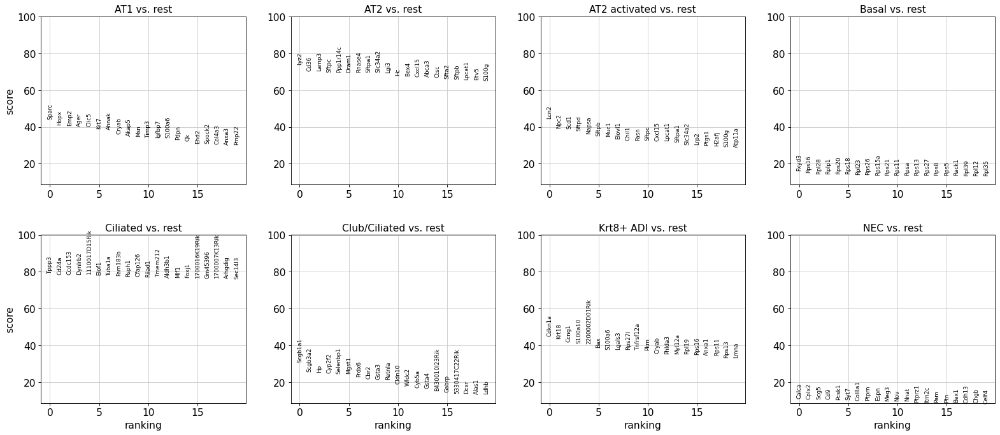

In [35]:
sc.tl.rank_genes_groups(adata, groupby = 'cell_type', groups = 'all', use_raw = True, method = 'wilcoxon', n_genes=100)
sc.pl.rank_genes_groups(adata)

In [36]:
## create marker table
result = adata.uns['rank_genes_groups']
allMarkers = []
for cluster in result['names'].dtype.names:
    current = pd.DataFrame({'gene': result['names'][cluster], 'score': result['scores'][cluster],
                            'logfoldchange': result['logfoldchanges'][cluster], 'pval': result['pvals'][cluster],
                            'pval_adj': result['pvals_adj'][cluster], 'cell_type': cluster})
    allMarkers.append(current)
allMarkers = pd.concat(allMarkers)
allMarkers.head()

,gene,score,logfoldchange,pval,pval_adj,cell_type
0,Sparc,44.299595,4.832010,0.0,0.0,AT1
1,Hopx,41.217426,4.070269,0.0,0.0,AT1
2,Emp2,40.830059,2.978464,0.0,0.0,AT1
3,Ager,40.598862,3.703366,0.0,0.0,AT1
4,Clic5,40.479771,5.002566,0.0,0.0,AT1


In [37]:
## save marker table
out_dir = '/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Data/'
allMarkers.to_csv(out_dir + 'marker_table_GLPG_epithelia_subset_NIKLAS.csv', sep = '\t', index = False)

### Summary figures

In [38]:
adata.obs.cell_type.cat.categories

Index(['AT1', 'AT2', 'AT2 activated', 'Basal', 'Ciliated', 'Club/Ciliated',
       'Krt8+ ADI', 'NEC'],
      dtype='object')

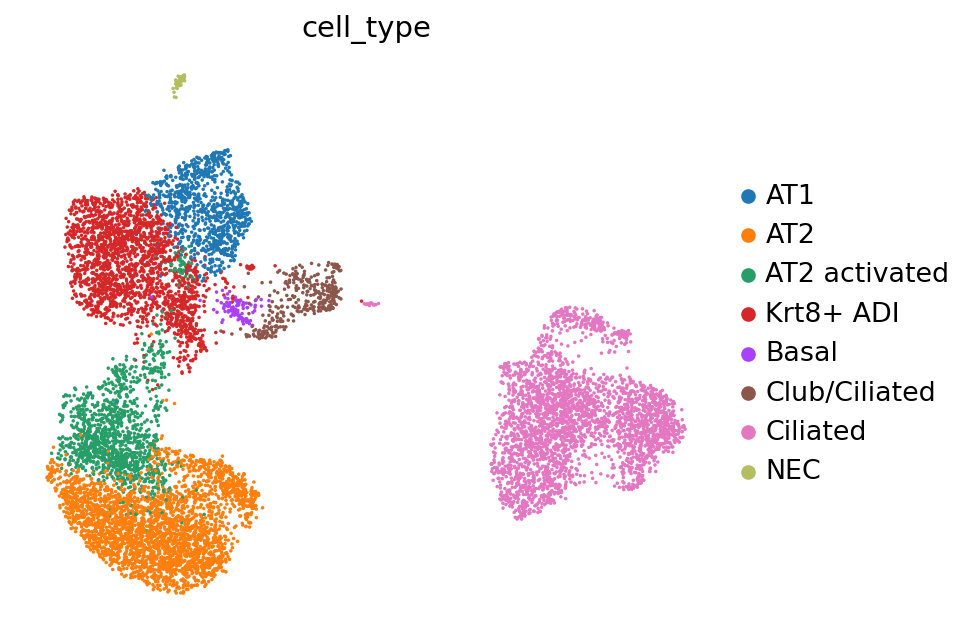

In [39]:
## change order of cell type labels
adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories(['AT1', 'AT2', 'AT2 activated',
                                                                                       'Krt8+ ADI',
                                                                                       'Basal', 
                                                                                       'Club/Ciliated', 'Ciliated',
                                                                                       'NEC'])
sc.pl.umap(adata, color = 'cell_type', ax = mysize(6, 5, 150), frameon = False)

... storing 'cell_type_compact' as categorical


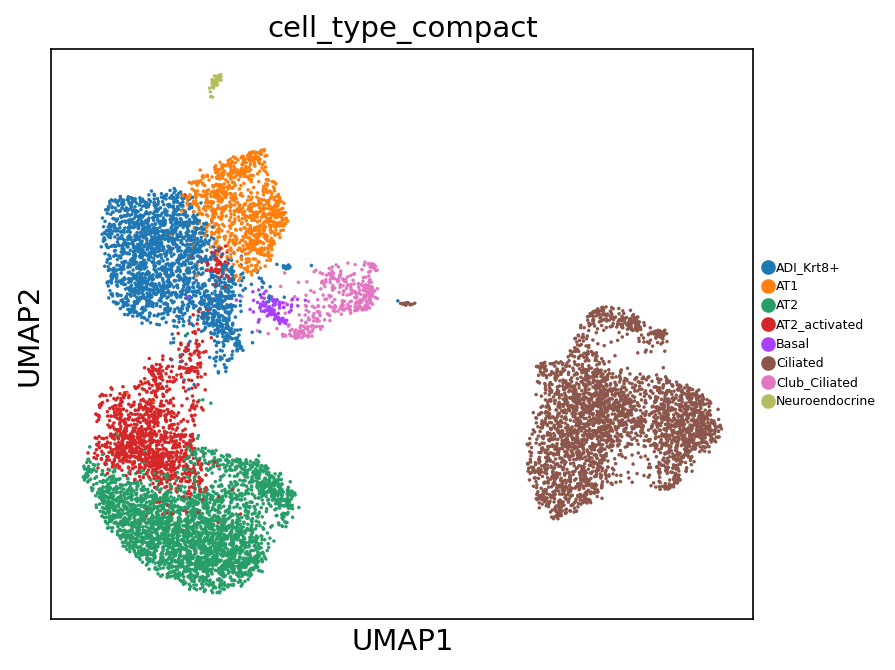

In [40]:
## special regex compatible cell type labels for GLPG :)
cell_type_conversion = {'AT1' : 'AT1',
                        'AT2' : 'AT2', 
                        'AT2 activated' :  'AT2_activated',
                        'Krt8+ ADI' : 'ADI_Krt8+',
                        'Basal' : 'Basal',
                        'Club/Ciliated' : 'Club_Ciliated',
                        'Ciliated' : 'Ciliated',
                        'NEC' : 'Neuroendocrine'
}
adata.obs['cell_type_compact'] = [cell_type_conversion[cluster] for cluster in adata.obs['cell_type']]
sc.pl.umap(adata, color = 'cell_type_compact', ax = mysize(6, 5, 150), legend_fontsize = 6)

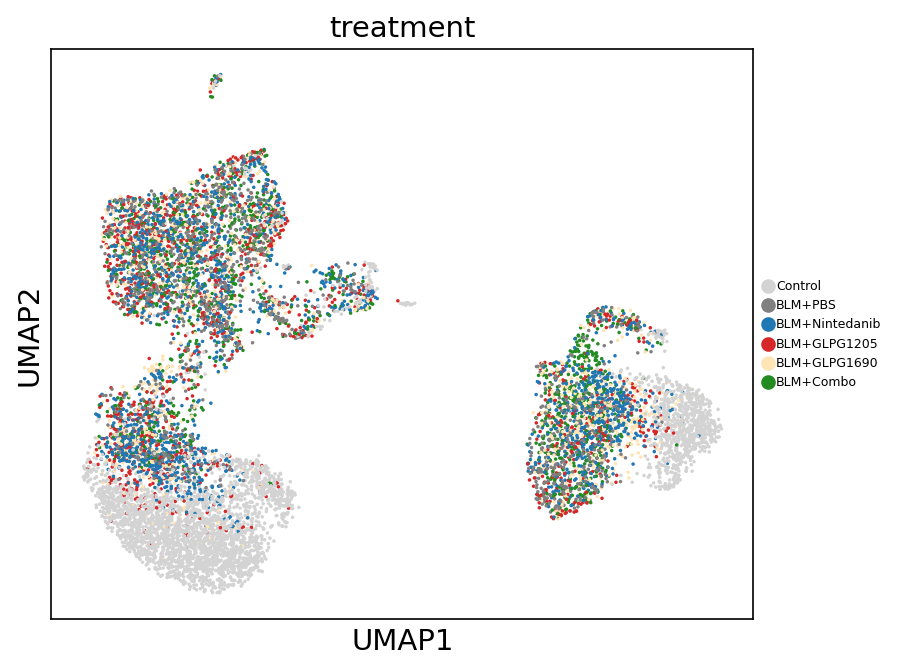

In [41]:
## rename condition label upon request of GLPG :)
treatment_conversion = {'none' : 'Control',
                        'vehicle' : 'BLM+PBS',
                        'Nintedanib' : 'BLM+Nintedanib',
                        'GLPG1205' : 'BLM+GLPG1205',
                        'GLPG1690' : 'BLM+GLPG1690',
                        'Combo' : 'BLM+Combo'
}
adata.obs['treatment'] = [treatment_conversion[t] for t in adata.obs['treatment']]
## reorder condition labels
adata.obs['treatment'] = adata.obs['treatment'].astype('category')
adata.obs['treatment'] = adata.obs['treatment'].cat.reorder_categories(['Control','BLM+PBS',
                                                                        'BLM+Nintedanib',
                                                                        'BLM+GLPG1205',
                                                                        'BLM+GLPG1690',
                                                                        'BLM+Combo'])
## plot UMAPs with new labels
sc.pl.umap(adata, color = 'treatment', ax = mysize(6, 5, 150), legend_fontsize = 6)

... storing 'treatment_time' as categorical


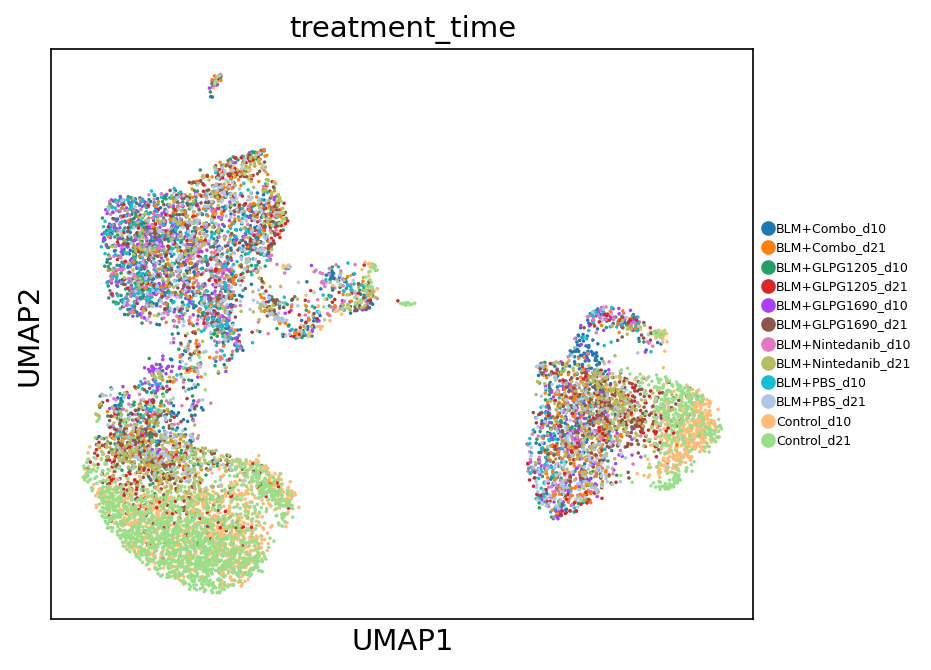

In [42]:
## rename treatment_time label upon request of GLPG :)
treatment_time_conversion = {'none_d10' : 'Control_d10',
                             'none_d21' : 'Control_d21',
                             'vehicle_d10' : 'BLM+PBS_d10',
                             'vehicle_d21' : 'BLM+PBS_d21',
                             'Nintedanib_d10' : 'BLM+Nintedanib_d10',
                             'Nintedanib_d21' : 'BLM+Nintedanib_d21',
                             'GLPG1205_d10' : 'BLM+GLPG1205_d10',
                             'GLPG1205_d21' : 'BLM+GLPG1205_d21',
                             'GLPG1690_d10' : 'BLM+GLPG1690_d10',
                             'GLPG1690_d21' : 'BLM+GLPG1690_d21',
                             'Combo_d10' : 'BLM+Combo_d10',
                             'Combo_d21' : 'BLM+Combo_d21'
}
adata.obs['treatment_time'] = [treatment_time_conversion[tt] for tt in adata.obs['treatment_time']]
sc.pl.umap(adata, color = 'treatment_time', ax = mysize(6, 5, 150), legend_fontsize = 6)

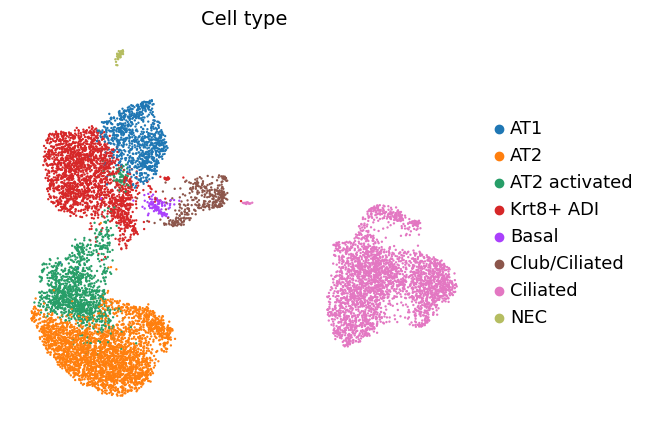

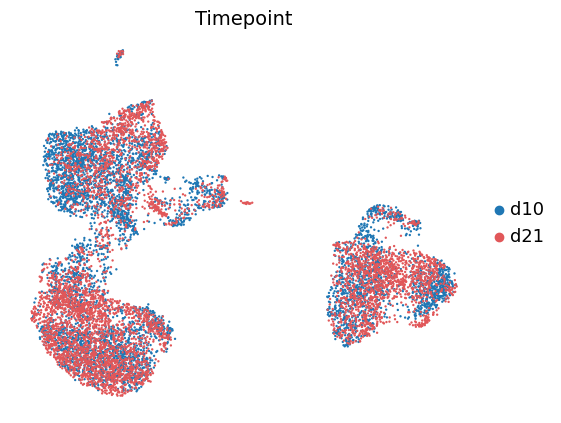

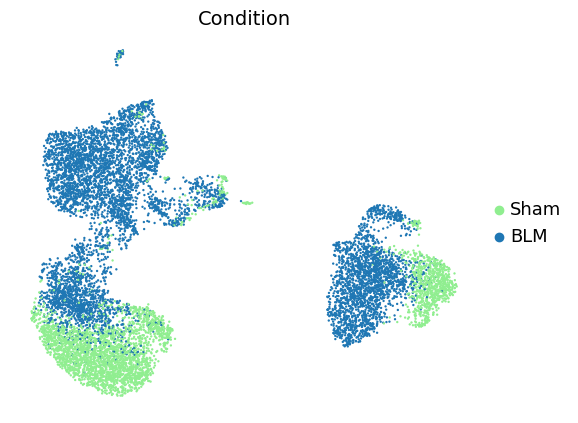

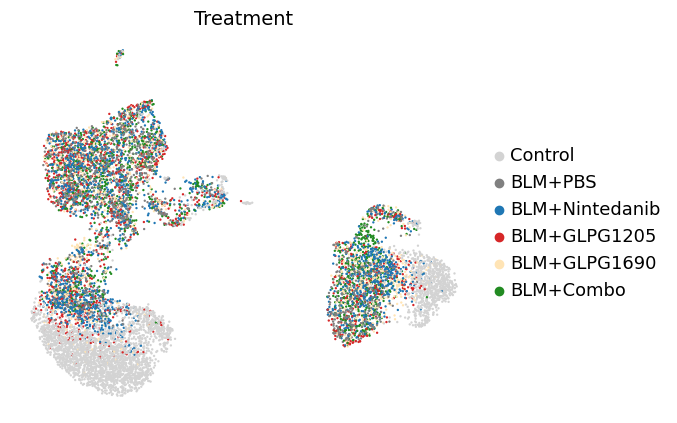

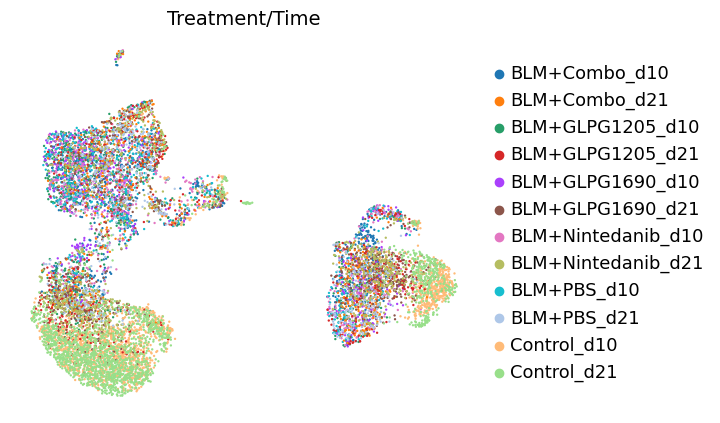

In [43]:
## save UMAP of MNPs for future use
sc.pl.umap(adata, color = ['cell_type'], title = 'Cell type', frameon = False, 
           ax = mysize(6, 5, 100), save = '_celltype.pdf')
sc.pl.umap(adata, color = ['time_point'], title = 'Timepoint', frameon = False, 
           ax = mysize(6, 5, 100), save = '_timepoint.pdf')
sc.pl.umap(adata, color = ['condition'], title = 'Condition', frameon = False, 
           ax = mysize(6, 5, 100), save = '_condition.pdf')
sc.pl.umap(adata, color = ['treatment'], title = 'Treatment', frameon = False, 
           ax = mysize(6, 5, 100), save = '_treatment.pdf')
sc.pl.umap(adata, color = ['treatment_time'], title = 'Treatment/Time', frameon = False, 
           ax = mysize(6, 5, 100), save = '_treatment_time.pdf')

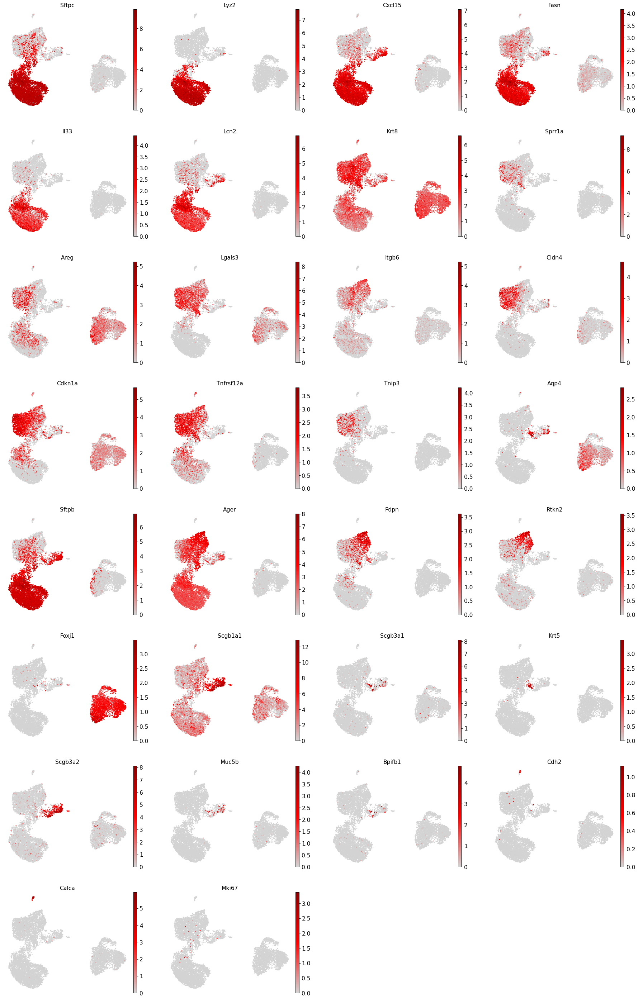

In [44]:
## save UMAP feature plot
sc.pl.umap(adata, color = ["Sftpc", "Lyz2", "Cxcl15", "Fasn", # AT2
                           "Il33", "Lcn2", # AT2 activated 
                           "Krt8", "Sprr1a", "Areg", "Lgals3",  "Itgb6", "Cldn4", "Cdkn1a", "Tnfrsf12a", "Tnip3", # ADI
                           "Aqp4", "Sftpb", # pre AT1
                           "Ager", "Pdpn", "Rtkn2", # AT1 
                           "Foxj1", # Ciliated
                           "Scgb1a1", "Scgb3a1", # Ciliated
                           "Krt5",  # Basal cells
                           "Scgb3a2", # Club cells
                           "Muc5b", "Bpifb1", # Goblet cells
                           "Cdh2", "Calca", # neuroendocrine cells
                           "Mki67" # proliferation
                          ], frameon = False, ncols = 4, cmap = gray_red, size = 25,
            save = '_epithelium_markers.pdf')

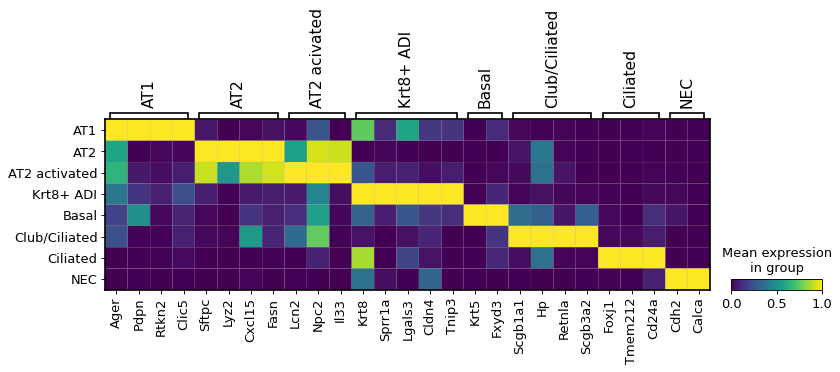

In [45]:
## custom heatmap
# matrixplot with marker genes
celltype_markers={'AT1' : ['Ager','Pdpn','Rtkn2','Clic5'],
                  'AT2' : ['Sftpc', 'Lyz2', 'Cxcl15', 'Fasn'],
                  'AT2 acivated' : ['Lcn2','Npc2', 'Il33'],
                  'Krt8+ ADI' : ['Krt8','Sprr1a', 'Lgals3','Cldn4','Tnip3'],
                  'Basal' : ['Krt5','Fxyd3'],
                  'Club/Ciliated' : ['Scgb1a1','Hp','Retnla','Scgb3a2'],
                  'Ciliated' : ['Foxj1','Tmem212','Cd24a'],
                  'NEC' : ['Cdh2','Calca']}

sc.pl.matrixplot(adata, celltype_markers, groupby = 'cell_type',standard_scale='var', dendrogram=False,
                     save='curated_markers.pdf' )

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_cell_type']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


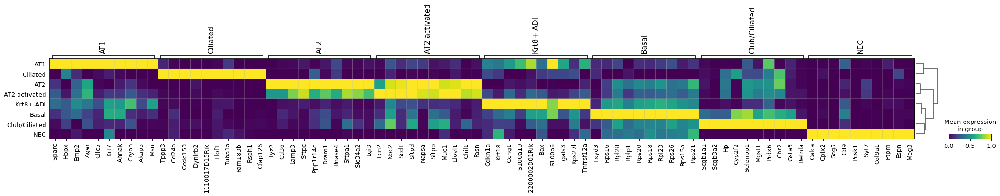

In [46]:
## automated heatmap
sc.tl.dendrogram(adata, groupby = 'cell_type')
sc.tl.rank_genes_groups(adata, groupby = 'cell_type', method = 'wilcoxon')
sc.pl.rank_genes_groups_matrixplot(adata, n_genes = 10, standard_scale = 'var', save= 'auto_markers.pdf')

In [47]:
## frequency table
xlabel = 'treatment'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,AT1,AT2,AT2 activated,Krt8+ ADI,Basal,Club/Ciliated,Ciliated,NEC,treatment
d100BLM_Combo48,0.219653,0.0,0.092486,0.427746,0.011561,0.156069,0.092486,0.0,BLM+Combo
d100BLM_G120528,0.133333,0.0,0.181818,0.490909,0.000000,0.012121,0.181818,0.0,BLM+GLPG1205


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/epithelia_subset/relfreqs_treatment.pdf


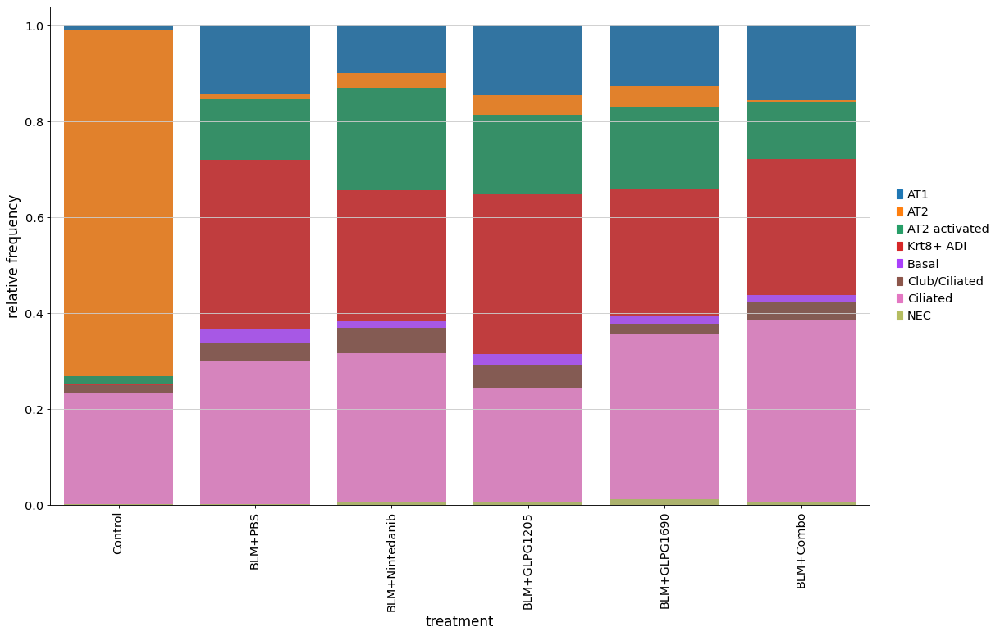

In [48]:
## cell type frequencies per treatment category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16,10), order = ['Control','BLM+PBS','BLM+Nintedanib','BLM+GLPG1205','BLM+GLPG1690','BLM+Combo'],
                               errbar = False, cols = cols, width = 0.8,
                               save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/epithelia_subset/relfreqs_treatment.pdf')

In [49]:
## frequency table
xlabel = 'treatment_time'
cell_types_label = 'cell_type'
cols = adata.uns['%s_colors' %cell_types_label]
celltypes = adata.obs[cell_types_label].cat.categories

relFreqs = codes.calc_relFreq(adata, group_by = cell_types_label, xlabel = xlabel, condition = None)
relFreqs.head(2)

,AT1,AT2,AT2 activated,Krt8+ ADI,Basal,Club/Ciliated,Ciliated,NEC,treatment_time
d100BLM_Combo48,0.219653,0.0,0.092486,0.427746,0.011561,0.156069,0.092486,0.0,BLM+Combo_d10
d100BLM_G120528,0.133333,0.0,0.181818,0.490909,0.000000,0.012121,0.181818,0.0,BLM+GLPG1205_d10


Saving Figure to /home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/epithelia_subset/relfreqs_treatment_time.pdf


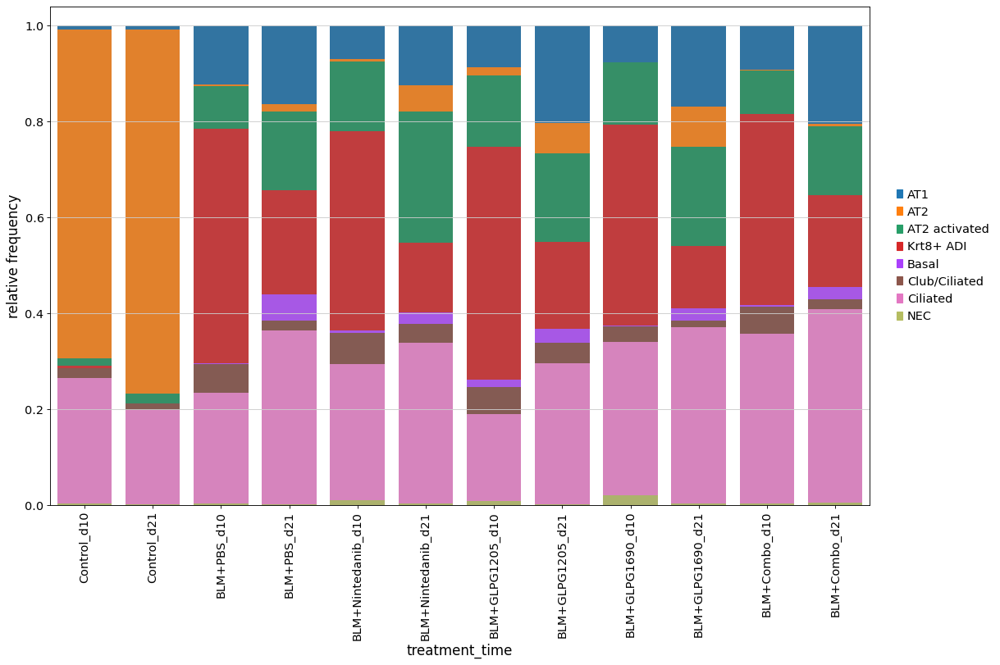

In [50]:
## cell type frequencies per treatment time category
codes.plot_cluster_composition(relFreqs, xlabel = xlabel, figsize = (16, 10),
            order = ['Control_d10','Control_d21','BLM+PBS_d10','BLM+PBS_d21','BLM+Nintedanib_d10','BLM+Nintedanib_d21',
                     'BLM+GLPG1205_d10','BLM+GLPG1205_d21','BLM+GLPG1690_d10','BLM+GLPG1690_d21','BLM+Combo_d10','BLM+Combo_d21'],
            errbar = False, cols = cols, width = 0.8, 
            save='/home/agando/Documents/Niklas/Projects/niche_environments_FIBROSIS/GLPG_full_bleomycin_10X_MICE/Figures/epithelia_subset/relfreqs_treatment_time.pdf')

### Save annotated subset

In [51]:
## save adata object
adata.write('/mnt/platte_1/Projects/210115_GLPG/subsets/210218_epcam+_subset_NIKLAS_annotated.h5ad')